In [1]:
import shap
import shap.maskers
import torch
import numpy as np
import matplotlib.pyplot as plt

import NN_Architectures as arch
from Functions.DataSet import PhenologicalDatasetTransposedMA
from sklearn.cluster import KMeans
from matplotlib import rcParams

rcParams['font.family'] = 'serif'  # Change to a serif font\


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


Loads the Shapley values provided and analysis them.

In [2]:
def get_feature_label(X):

    dict_names ={
        0: 'Rank One Leaf Date',
        1: 'Appeared Spathe Date',
        2: 'Opened Spathe Date',
        3: 'Flowering Date',
        4: 'Harvest Date',
        5: 'Bunch Mass',
        6: 'Female Inflorescence',
        7: 'Male Inflorescence',
        8: 'Aborted Inflorescence',
        9: 'Bunch Load',
        
        10: 'Temperature (Min)',
        11: 'Temperature (Max)',
        12: 'Temperature (Average)',
        13: 'RH (Min)',
        14: 'RH (Max)',
        15: 'RH (Average)',
        16: 'Wind Speed',
        17: 'Rainfall',
        18: 'Rg'
    }
    dict_names_ex ={
        0: 'RankOneLeafDate',
        1: 'AppearedSpatheDate_compl',
        2: 'OpenedSpatheDate_compl',
        3: 'FloweringDate_compl',
        4: 'HarvestDate_compl',
        5: 'BunchMass',
        6: 'AbortedInflo',
        7: 'TMin',
        8: 'TMax',
        9: 'TAverage',
        10: 'HRMin',
        11: 'HRMax',
        12: 'HRAverage',
        13: 'WindSpeed',
        14: 'Rainfall',
        15: 'Rg'
    }
    dict_names_ex_flowers ={
    0: 'RankOneLeafDate',
    1: 'AppearedSpatheDate_compl',
    2: 'OpenedSpatheDate_compl',
    3: 'FloweringDate_compl',
    4: 'HarvestDate_compl',
    5: 'BunchMass',
    6: 'AbortedInflo',
    7: 'BunchLoad',

    8: 'TMin',
    9: 'TMax',
    10: 'TAverage',
    11: 'HRMin',
    12: 'HRMax',
    13: 'HRAverage',
    14: 'WindSpeed',
    15: 'Rainfall',
    16: 'Rg'
    }

    try:
        if len(X[0]) == 19:
            dict_names = dict_names
        elif len(X[0]) == 16:
            dict_names = dict_names_ex
        elif len(X[0]) == 17:
            dict_names = dict_names_ex_flowers
    except:
        if len(X) == 19:
            dict_names = dict_names
        elif len(X) == 16:
            dict_names = dict_names_ex
        elif len(X) == 17:
            dict_names = dict_names_ex_flowers

    return dict_names

In [3]:
def get_no_phenological_features(shap_values):
    try:
        shap_values = shap_values.reshape(-1, 40, 190)
        n_pheno_features = 10
    except:
        try:
            shap_values = shap_values.reshape(-1, 40, 187)
            n_pheno_features = 7
        except:
            shap_values = shap_values.reshape(-1, 40, 188)
            n_pheno_features = 8
    return shap_values, n_pheno_features

In [4]:
def get_all_shapley_values_per_feature(shap_values, n_pheno_features):
    all_features_shaps = []

    #reshape shap values to be able to iterate over samples, 20 day periods and features

    #initialize list of list of shap values for each feature
    for i in range(9+n_pheno_features):
        all_features_shaps.append([])

    for sample in range(shap_values.shape[0]):

        for tweenty_day_period in range(shap_values.shape[1]):

            for pheno_features in range(0,n_pheno_features):
                all_features_shaps[pheno_features].append(shap_values[sample, tweenty_day_period, pheno_features])
            
            for days in range(20):

                for weather_features in range(0,9):
                    # since days starts with 0 and weather_features with 10, we need to multiply days by 10 to get the correct index
                    all_features_shaps[weather_features+n_pheno_features].append(shap_values[sample, tweenty_day_period, n_pheno_features + weather_features + days*9])
    return all_features_shaps

In [5]:
def time_wise_shaps(shap_values):
    '''Takes in shapley values and returns the average and sum of the shap values for each 20_day_period
    args: 
    shap_values: numpy array of shapley values with shape (samples, 35, 188)
    return:
    avg_abs_time_shaps: numpy array of average of absolute shap values for each 20_day_period
    avg_time_shaps: numpy array of average of shap values for each 20_day_period    
    sum_abs_time_shaps: numpy array of sum of absolute shap values for each 20_day_period   
    sum_time_shaps: numpy array of sum of shap values for each 20_day_period
    '''
    

    #create list with 35 empty lists
    time_shaps_avg = []
    time_shaps_sum = []
    time_abs_shaps_avg = []
    time_abs_shaps_sum = []
    for i in range(shap_values.shape[1]):
        time_shaps_avg.append([])
        time_shaps_sum.append([])
        time_abs_shaps_avg.append([])
        time_abs_shaps_sum.append([])

    #loop samples
    for sample in range(shap_values.shape[0]):
        #loop 35 20_day_periods
        for tweenty_day_period in range(shap_values.shape[1]):
            #append the mean of the shap_values of the 188 features 
            time_shaps_avg[tweenty_day_period].append(np.mean(shap_values[sample, tweenty_day_period,:]))
            time_shaps_sum[tweenty_day_period].append(np.sum(shap_values[sample, tweenty_day_period,:]))

            time_abs_shaps_avg[tweenty_day_period].append(np.mean(np.abs(shap_values[sample, tweenty_day_period,:])))
            time_abs_shaps_sum[tweenty_day_period].append(np.sum(np.abs(shap_values[sample, tweenty_day_period,:])))
    
    avg_abs_time_shaps = np.zeros(len(time_shaps_avg))
    avg_time_shaps = np.zeros(len(time_shaps_avg))
    sum_abs_time_shaps = np.zeros(len(time_shaps_sum))
    sum_time_shaps = np.zeros(len(time_shaps_sum))

    # calculate the sum and mean of the shap values for each 20_day_period
    for i, data in enumerate(zip(time_abs_shaps_sum, time_shaps_sum)):
        sum_abs_time_shaps[i] = np.sum(np.array(data[0]).__abs__())
        sum_time_shaps[i] = np.mean(np.array(data[1]))



    return (avg_abs_time_shaps, avg_time_shaps, sum_abs_time_shaps, sum_time_shaps)

In [6]:
def feature_wise_shaps(all_features_shaps, n_pheno_features):
    '''Takes in all feature shapley values and returns several sorted versions of it

    args:
    all_features_shaps: list of lists of shap values for each feature

    return:
    all_features_shaps: list of numpy arrays of shap values for each feature
    
    abs_sum_feature_shaps: sum of absolute shap values for each feature (total strength of the feature) 
    sum_feature_shaps: sum of shap values for each feature (total contribution of the feature, plus or minus tendency)

    abs_avg_feature_shaps: average of absolute shap values for each feature (average strength of a feature per data point)
    avg_feature_shaps: average of shap values for each feature (average contribution of a feature per data point)
    '''
    abs_sum_feature_shaps = np.zeros(9+n_pheno_features)
    sum_feature_shaps = np.zeros(9+n_pheno_features)
    abs_avg_feature_shaps = np.zeros(9+n_pheno_features)
    avg_feature_shaps = np.zeros(9+n_pheno_features)

    for i, data in enumerate(all_features_shaps):
        
        all_features_shaps[i] = np.array(data)

        abs_sum_feature_shaps[i] = np.sum(np.array(data).__abs__())
        sum_feature_shaps[i] = np.sum(np.array(data))

        abs_avg_feature_shaps[i] = np.mean(np.array(data).__abs__())
        avg_feature_shaps[i] = np.mean(np.array(data))

    return (all_features_shaps, abs_sum_feature_shaps, sum_feature_shaps, abs_avg_feature_shaps, avg_feature_shaps)

# Load Shapley values 

In [7]:
def load_shapley_vals(path):
    ''' Loads shapley values from a file and returns several sorted versions of it

    args: 
    path: path to the file containing the shapley values

    Sorted versions include:
    output: tuple of two tuples
    output[0]:tuple of five numpy arrays, feature wise shapley values
        output[0][0]: all_features_shaps: list of numpy arrays of shap values for each feature (time series for each feature)
    
        output[0][1]: abs_sum_feature_shaps: sum of absolute shap values for each feature (total strength of the feature, data point for each feature) 
        output[0][2]: sum_feature_shaps: sum of shap values for each feature (total contribution of the feature, plus or minus tendency)

        output[0][3]: abs_avg_feature_shaps: average of absolute shap values for each feature (average strength of a feature per data point, data point for each feature)
        output[0][4]:avg_feature_shaps: average of shap values for each feature (average contribution of a feature per data point)
        
    output[1]: tuple of 4 numpy arrays, time wise shapley values    
        output[1][0]: avg_abs_time_shaps: numpy array of average of absolute shap values for each 20_day_period (data point for each 20_day_period)
        output[1][1]: avg_time_shaps: numpy array of average of shap values for each 20_day_period (data point for each 20_day_period)
        output[1][2]: sum_abs_time_shaps: numpy array of sum of absolute shap values for each 20_day_period (data point for each 20_day_period) 
        output[1][3]: sum_time_shaps: numpy array of sum of shap values for each 20_day_period (data point for each 20_day_period)
    output[2]: shapley_values: numpy array of shapley values
    output[3]: n_pheno_features: number of phenological features in the dataset
    output[4]: samples: number of samples in the dataset
        '''
    shapley_values = np.load(path, allow_pickle=True)
    samples = shapley_values.shape[0]

    shap_values, n_pheno_features = get_no_phenological_features(shapley_values)
    all_features_shaps = get_all_shapley_values_per_feature(shap_values, n_pheno_features)
    feature_wise = feature_wise_shaps(all_features_shaps, n_pheno_features)
    time_wise = time_wise_shaps(shap_values)
    
    return (feature_wise, time_wise, shap_values,n_pheno_features,samples)

shaps = load_shapley_vals('/home/u108-n256/PalmProject/CrossValidation/OPTIM/Shapley_values.npy')

# Load the corresponding Samples to the Shapley values

The samples from which the shappley values were calculated

In [8]:
def load_samples(path):
    ''' Same as load_shapley_vals, but for the samples
    '''
    shapley_values = np.load(path, allow_pickle=True)
    samples = shapley_values.shape[0]

    shap_values, n_pheno_features = get_no_phenological_features(shapley_values)
    all_features_shaps = get_all_shapley_values_per_feature(shap_values, n_pheno_features)
    feature_wise = feature_wise_shaps(all_features_shaps, n_pheno_features)
    time_wise = time_wise_shaps(shap_values)
    
    return (feature_wise, time_wise, samples, n_pheno_features, samples)
    
samples = load_samples('/home/u108-n256/PalmProject/CrossValidation/OPTIM/Kmeans_samples_25.npy')

In [9]:

# Assuming shapley_values is already defined and is a 2D array (e.g., list of lists or np.array)
def plot_shapley_values_all_features_all_time(shapley_value):
    shapley_value = np.sum(np.abs(shapley_value.reshape(100,-1)), axis=0)

    # Calculate the moving average of the last 10 datapoints
    window_size = 400
    moving_average = np.convolve(shapley_value, np.ones(window_size)/window_size, mode='valid')


    # Plot the SHAP values average for all features
    plt.plot(shapley_value, label='Mean SHAP values')
    plt.plot(range(window_size - 1, len(shapley_value)), moving_average*10, label=f'Moving average (last {window_size})', linestyle='--')

    # Adding title and labels
    plt.title('SHAP values average across all features')
    plt.ylabel('SHAP value')
    plt.xlabel('Feature (#)')

    # Add legend to identify the lines
    plt.legend()

    # Show plot
    plt.show()

In [10]:
import os 


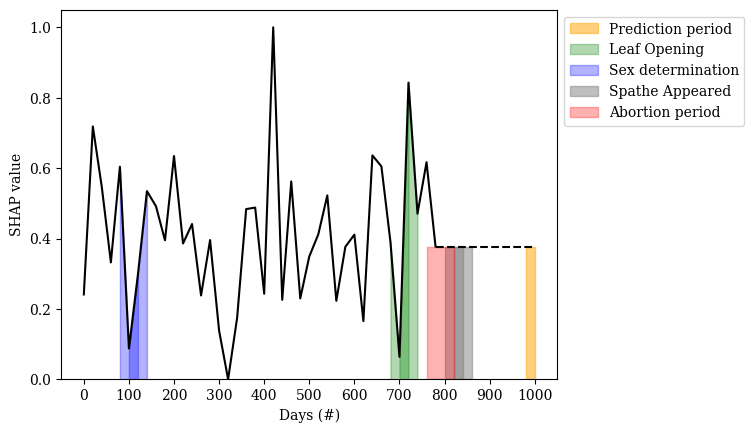

In [23]:
from Modules import normalize_array
#plt.plot(np.array(sum_time_shaps), label='value')
def plot_all_per_period(data, data2=None, plot_events=True):

    spathe_appeared = 42
    leaf_one_point = 36
    sexualization = 6
    data = (np.array(data) - np.min(data)) / (np.max(data) - np.min(data))
    plt.plot(np.array(data), color='black')
    plt.hlines(data[-1],39,50, colors='black', linestyles='--')

    if not any(data < 0):
        plt.fill_between(range(49,51), data[-1], alpha=0.5, label='Prediction period', color='orange')
        if data2 is not None:
            plt.plot(np.array(data2), alpha=0.5, color='grey')
        plt.ylim(0)

        # Fill areas
        #plt.fill_between(range(50), sum_time_shaps, alpha=0.3)
    if plot_events:
        plt.fill_between(range(leaf_one_point-2,leaf_one_point+2), data[leaf_one_point-2:leaf_one_point+2], alpha=0.3, color='green')
        plt.fill_between(range(leaf_one_point-1,leaf_one_point+1), data[leaf_one_point-1:leaf_one_point+1], alpha=0.3, color='green', label='Leaf Opening')

        plt.fill_between(range(sexualization-2,sexualization+2), data[sexualization-2:sexualization+2], alpha=0.3, color='blue')
        plt.fill_between(range(sexualization-1,sexualization+1), data[sexualization-1:sexualization+1], alpha=0.3, color='blue', label='Sex determination')

        plt.fill_between(range(spathe_appeared-2,spathe_appeared+2), data[-1], alpha=0.5, color='grey', label='Spathe Appeared')
        plt.fill_between(range(spathe_appeared-1,spathe_appeared+1), data[-1], alpha=0.5, color='grey')
                        


        plt.fill_between(range(38,42), data[-1], alpha=0.3, label= 'Abortion period', color='red')


    if any(data < 0):
        plt.hlines(0, 0, 50, colors='black')   


    #plt.vlines(32, 0, 0.04, colors='black', linestyles='--', label='Leaf Opening')
    #plt.vlines(12, 0, 0.04, colors='black', label='Sex determination')

    plt.xlabel('Days (#)')
    plt.ylabel('SHAP value')
    
    plt.legend(bbox_to_anchor=(1, 1))
    plt.xticks(range(0, 52, 5),labels=range(0, 1021, 100))
    plt.show()

plot_all_per_period(shaps[1][2], plot_events=True)

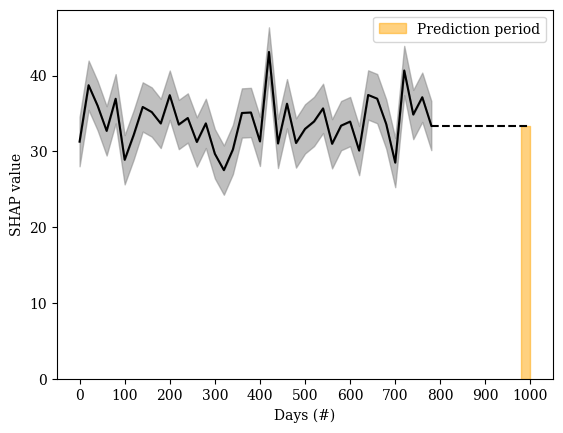

In [12]:
#plt.plot(np.array(sum_time_shaps), label='value')
def plot_all_per_period_error(data, data2=None, plot_events=True):
    stds = np.std(np.array(data), axis=0)
    plt.plot(np.array(data), color='black')
    plt.fill_between(np.arange(0,len(data)), np.array(data)+stds, np.array(data), color='grey', alpha=0.5)
    plt.fill_between(np.arange(0,len(data)), np.array(data)-stds, np.array(data), color='grey', alpha=0.5)
    plt.hlines(data[-1],39,50, colors='black', linestyles='--')

    if not any(data < 0):
        plt.fill_between(range(49,51), data[-1], alpha=0.5, label='Prediction period', color='orange')
        if data2 is not None:
            plt.plot(np.array(data2), alpha=0.5, color='grey')
        plt.ylim(0)

        # Fill areas
        #plt.fill_between(range(50), sum_time_shaps, alpha=0.3


    if any(data < 0):
        plt.hlines(0, 0, 50, colors='black')   


    #plt.vlines(32, 0, 0.04, colors='black', linestyles='--', label='Leaf Opening')
    #plt.vlines(12, 0, 0.04, colors='black', label='Sex determination')

    plt.xlabel('Days (#)')
    plt.ylabel('SHAP value')
    
    plt.legend(bbox_to_anchor=(1, 1))
    plt.xticks(range(0, 52, 5),labels=range(0, 1021, 100))
    plt.show()

plot_all_per_period_error(shaps[1][2], plot_events=True)

In [13]:
import matplotlib.patches as mpatches

# shows the absolute shapley values (=overall importance) for each feature
def plot_bar_features(data_, samples, title, scaling = True, ordering=True):
    data = data_.copy()
    feature_labels = get_feature_label(data)
    if scaling:
        # Assuming all_features_shaps and dict_names are already defined
        if len(data) == 19:
            n_pheno_features = 10
        elif len(data) == 16:
            n_pheno_features = 7
        elif len(data) == 17:
            n_pheno_features = 8
        total_features = 40*(n_pheno_features+20*9)
        print((1/n_pheno_features)/(40*20/total_features))
        # Convert the feature SHAP values array to a numpy array if it's not already
        #pheno data
        data[:n_pheno_features] = ((np.array(data)[:n_pheno_features])/samples) * ((1/n_pheno_features)/(40/total_features))
        #weather data
        data[n_pheno_features:] = ((np.array(data)[n_pheno_features:])/samples) * ((1/n_pheno_features)/(20*40/total_features))

    if ordering:
        ordering_ids = np.argsort(data)
        feature_labels = [feature_labels[i] for i in ordering_ids]
        data = data[ordering_ids]
        print(list(ordering_ids)[::-1])

    
    # Create a bar chart with horizontal bars
    plt.barh(np.arange(len(data))*1.5, data, zorder=2, color= ['#4BAC3F' if i < n_pheno_features else '#3778C2' for i in ordering_ids]) 

    # Set y-ticks with feature names
    plt.yticks(np.arange(len(data))*1.5, feature_labels)
    plt.xticks(np.arange(0, np.max(data)*1.1, 0.1))

    #add legend with blue and green label
    labels = ['Phenological features', 'Meteorological features']
    handels = [mpatches.Patch(color='#4BAC3F'), mpatches.Patch(color='#3778C2')]
    plt.legend(handels, labels, frameon=False)

    plt.xlabel('Sum absolute shapley values')


    # Add grid lines for better readability
    #plt.grid( axis='x', which='both',zorder=1)

    # Show the plot
    plt.savefig('/home/u108-n256/PalmProject/NeuralNetwork_Testing/Saved_Objects/Graphs/abs_shap_feature_importance.svg', bbox_inches='tight')
    plt.show()


0.9500000000000001
[15, 12, 13, 18, 17, 0, 11, 2, 7, 9, 6, 3, 5, 1, 4, 10, 8, 16, 14]


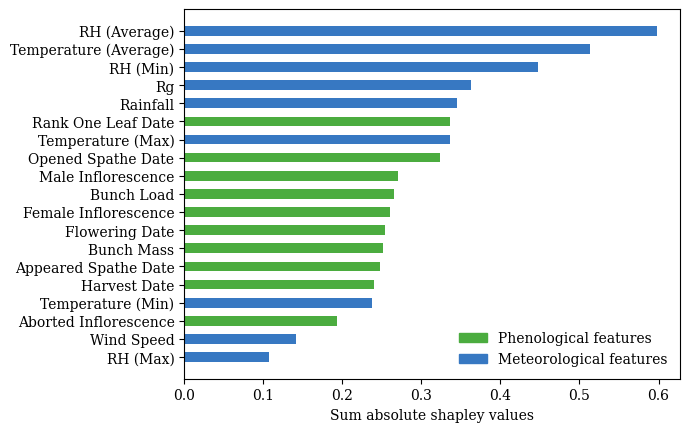

In [14]:
plot_bar_features(shaps[0][1], shaps[4], title='CNN Male', scaling=True, ordering=True)

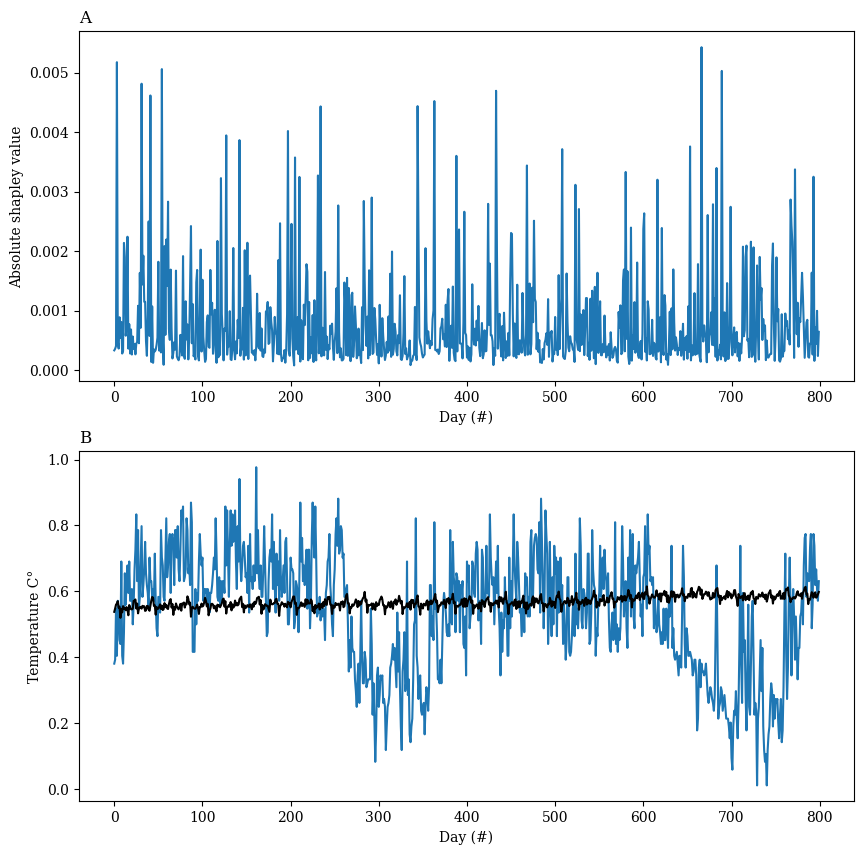

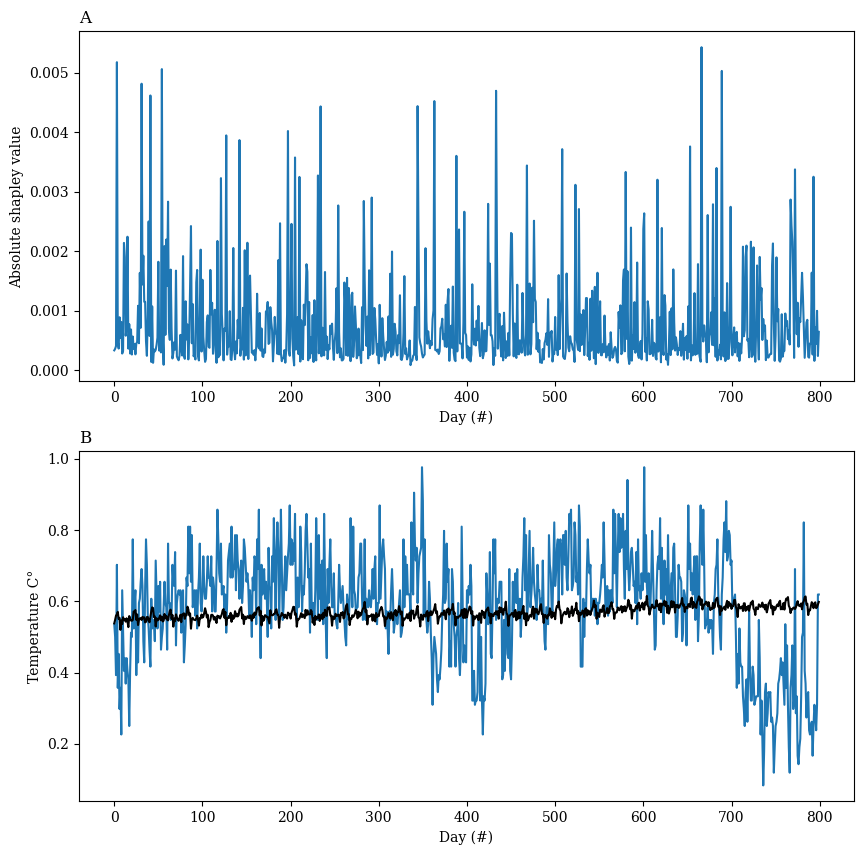

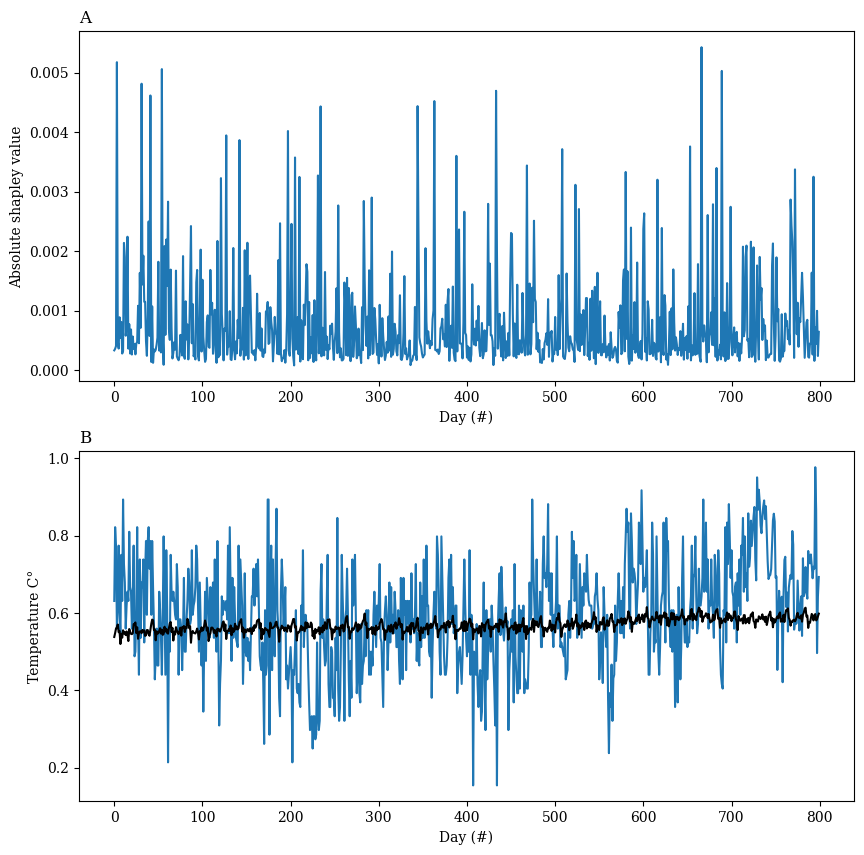

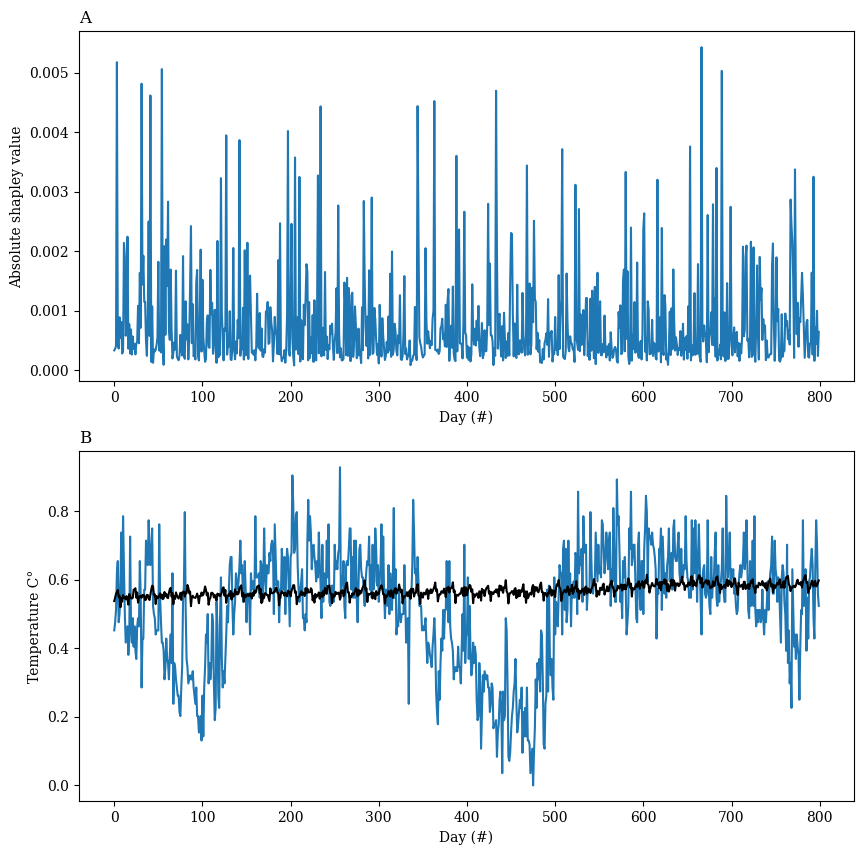

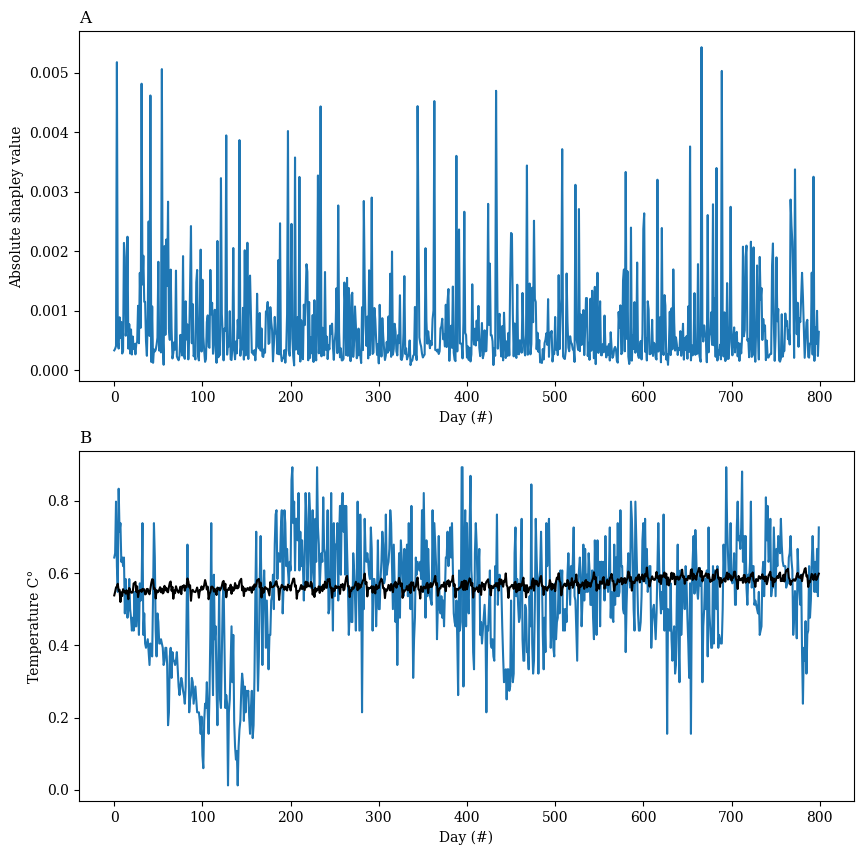

...

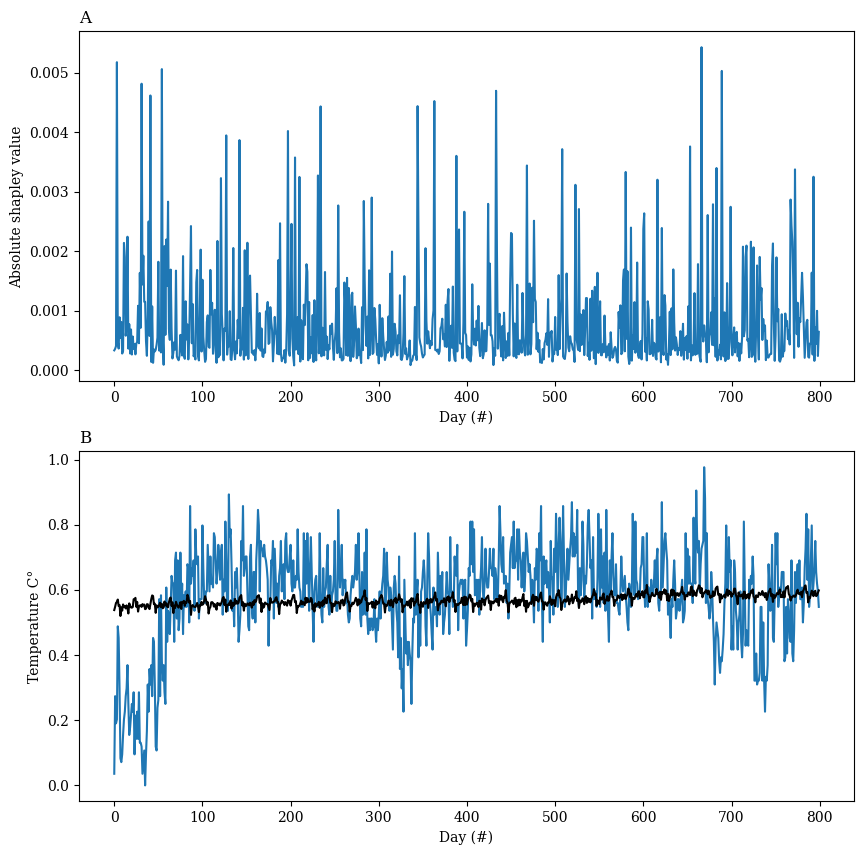

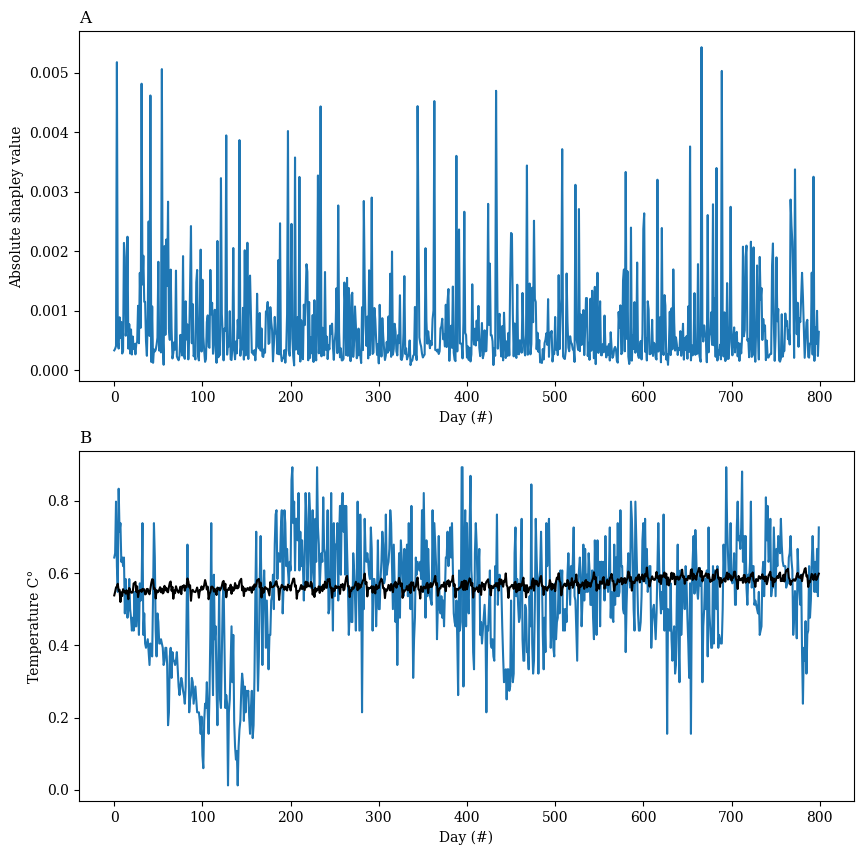

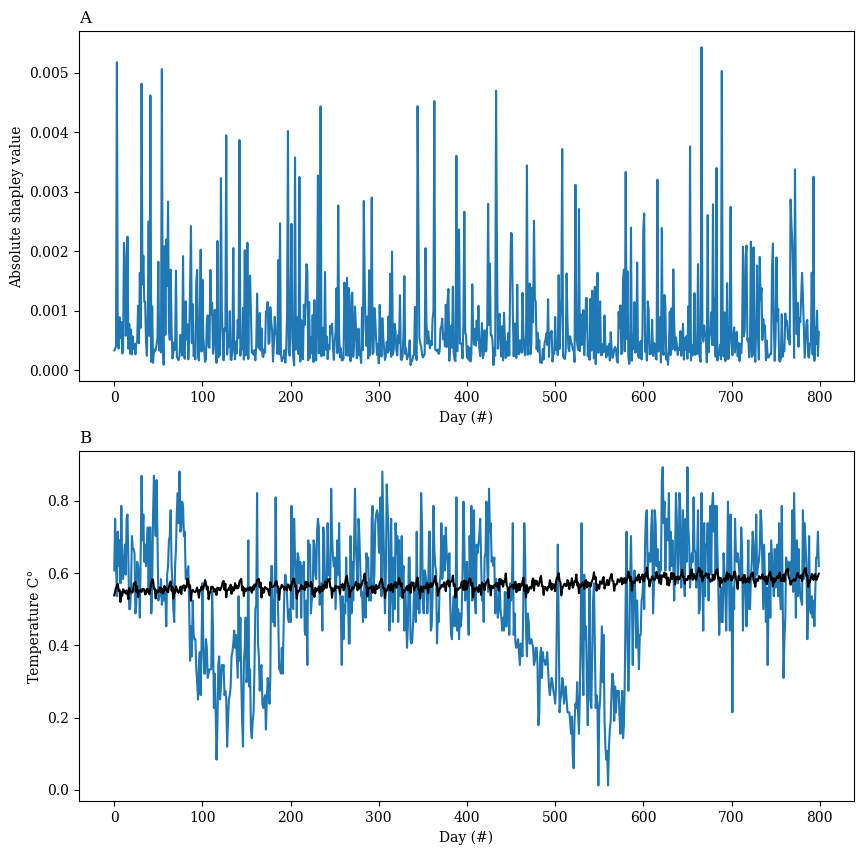

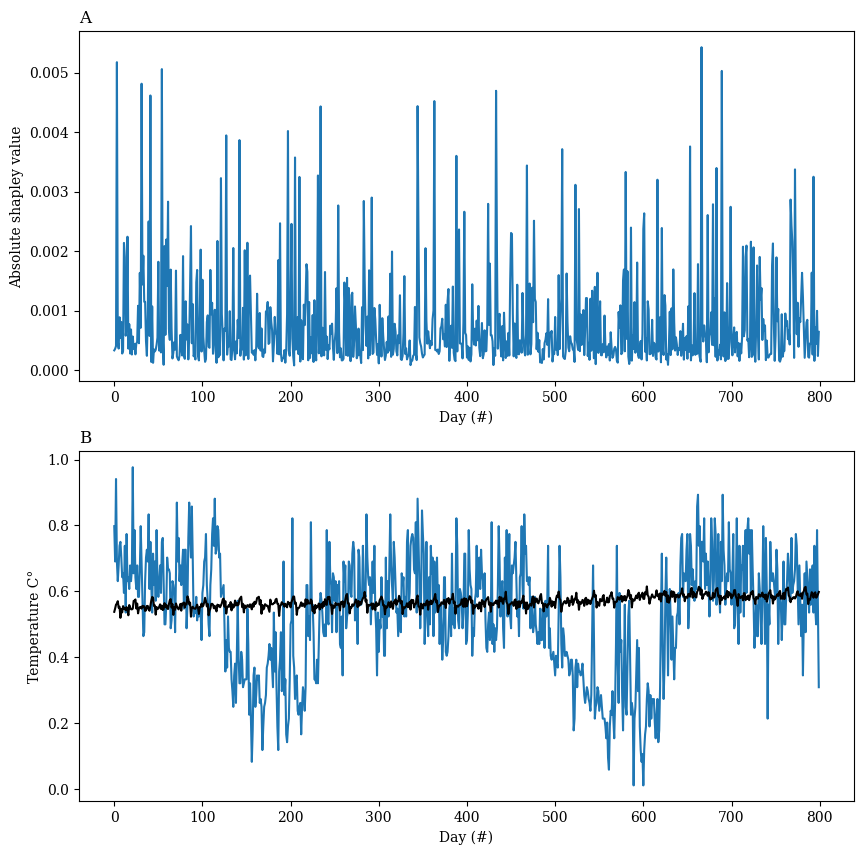

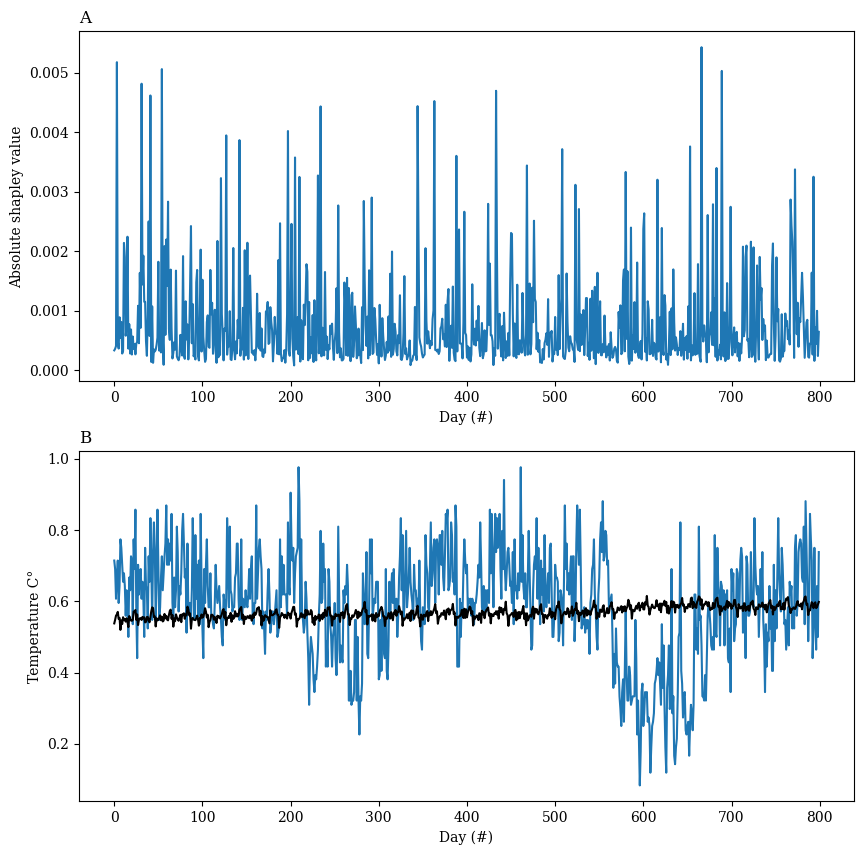

KeyboardInterrupt: 

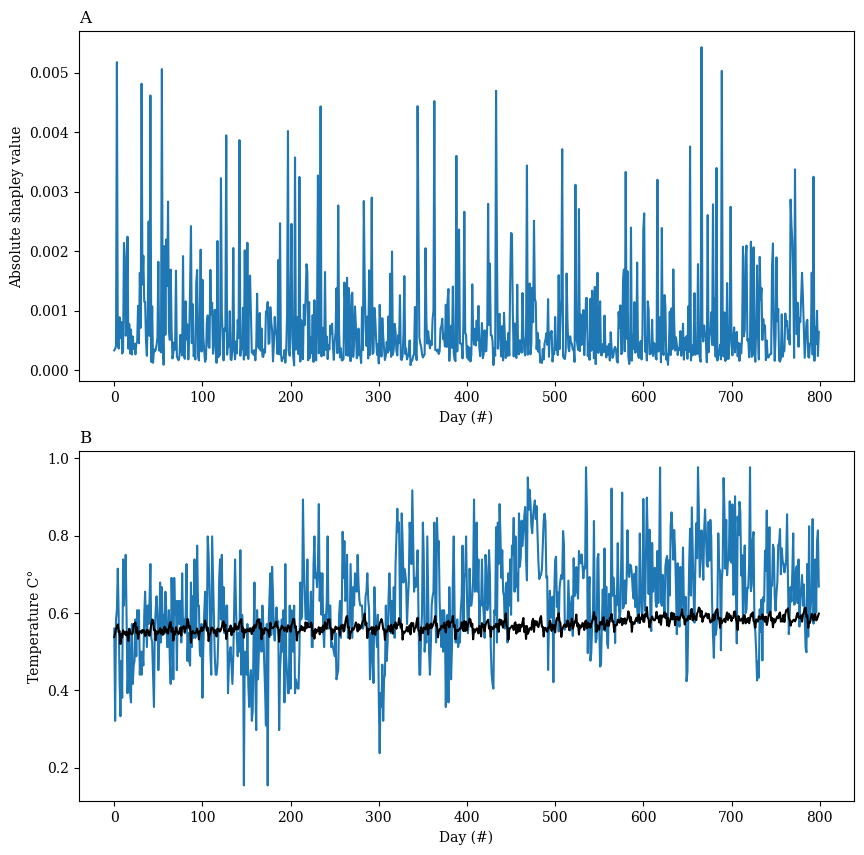

In [21]:

#shows which actual value of the feature (e.g. temperature) caused the shap value
def plot_feature_correlation_with_samples(all_features_shaps, all_samples, samples):
    for id in [15, 12, 13, 18, 17, 0, 11,]:
        
        f = all_features_shaps[id].reshape(samples,-1)
        s = all_samples[id].reshape(samples,-1)

        # Calculate the mean and sum of SHAP values across all features
        plot_data_mean = np.mean(np.abs(np.array(f).reshape(samples, -1)), axis=0)
        plot_data_std = np.std(np.array(f).reshape(samples, -1), axis=0)
        plot_data_sum = np.sum(np.abs(np.array(f).reshape(samples, -1)), axis=0)

        plot_samples = np.mean(np.abs(np.array(s).reshape(samples, -1)), axis=0)
        plot_samples_sum = np.sum(np.abs(np.array(s).reshape(samples, -1)), axis=0)
        
        # Plot the sum of SHAP values
        #plt.hlines(0, 0, len(plot_data_sum), color='r')
        for shap in range(f.shape[0]):
            fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(10, 10))
            ax1.plot(plot_data_mean)
            ax1.set_ylabel('Absolute shapley value')
            ax1.set_xlabel('Day (#)')
            #ax1.set_ylim(-0.015,0.015)
            ax2.plot(s[shap])
            ax2.plot(plot_samples, color='black')
            # Set y-axis tick labels to match the ticks
            #ax2.set_yticklabels(np.arange(30,75,5))
            ax2.set_ylabel('Temperature C°')
            ax2.set_xlabel('Day (#)')
            #ax1.set_xlim(300,400)
            #ax2.set_xlim(300,400)

            # Plot the centered moving average of the sum of SHAP values
            ax1.set_title(f'A', loc='left')
            ax2.set_title(f'B',loc='left')

            plt.savefig(f'/home/u108-n256/PalmProject/NeuralNetwork_Testing/Saved_Objects/Graphs/shaps_time_sample_{shap}.svg')
            plt.show()




plot_feature_correlation_with_samples(shaps[0][0], samples[0][0], shaps[4])

For retrieving the samples used in the shapley test


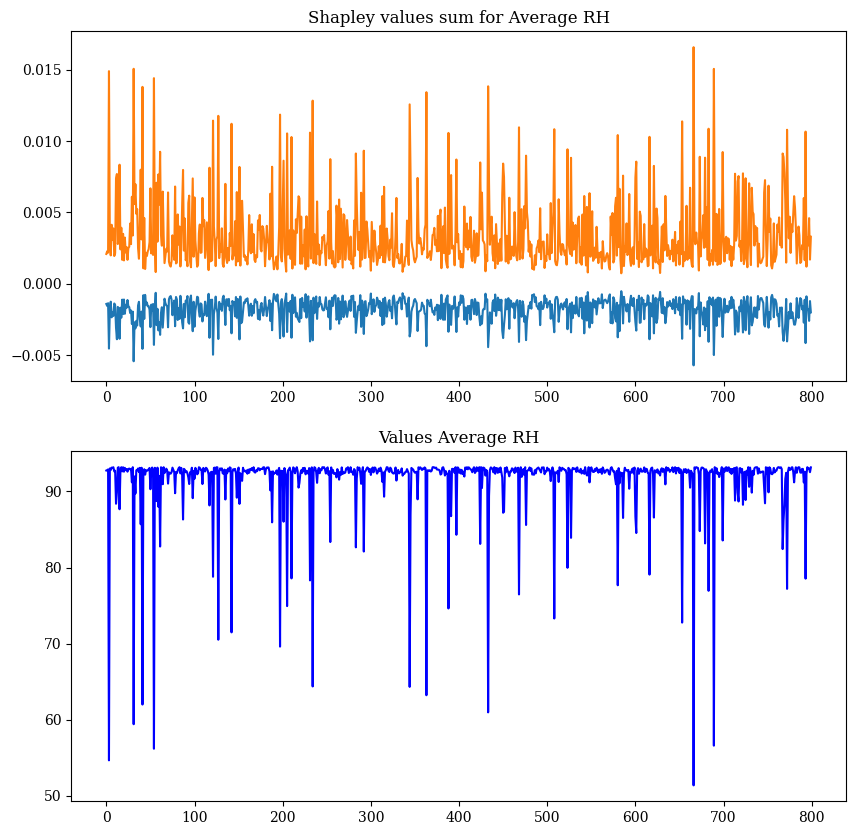

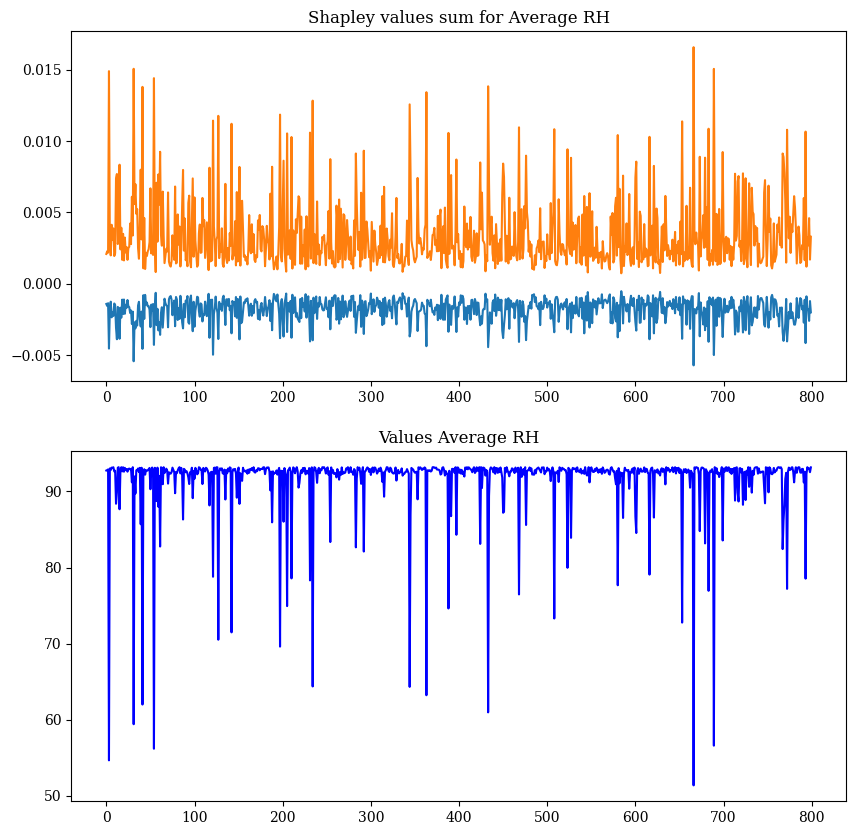

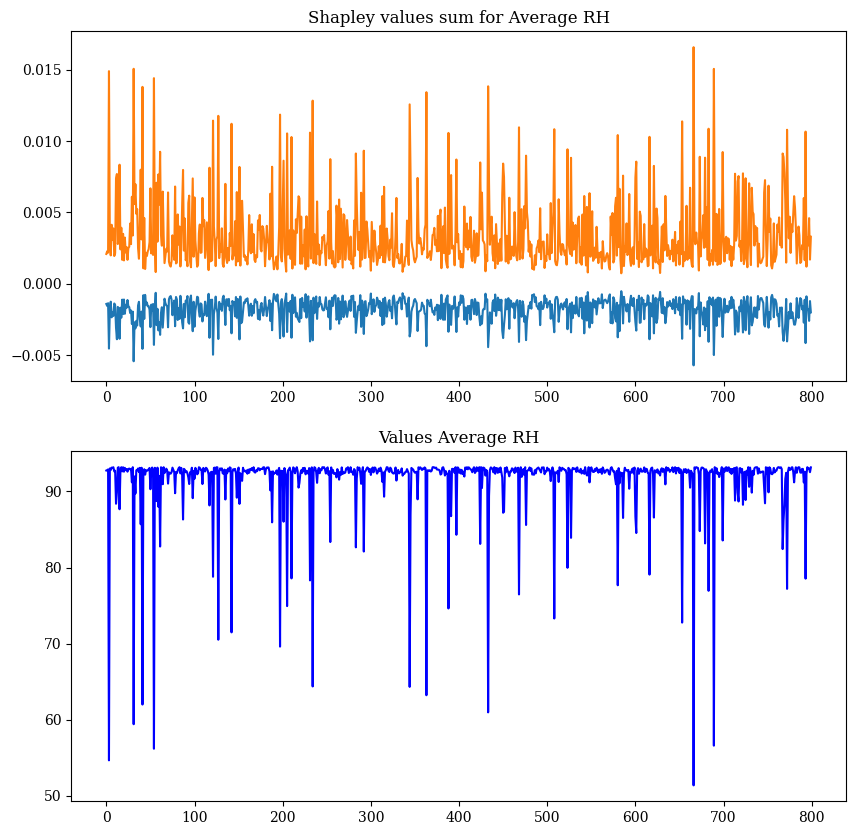

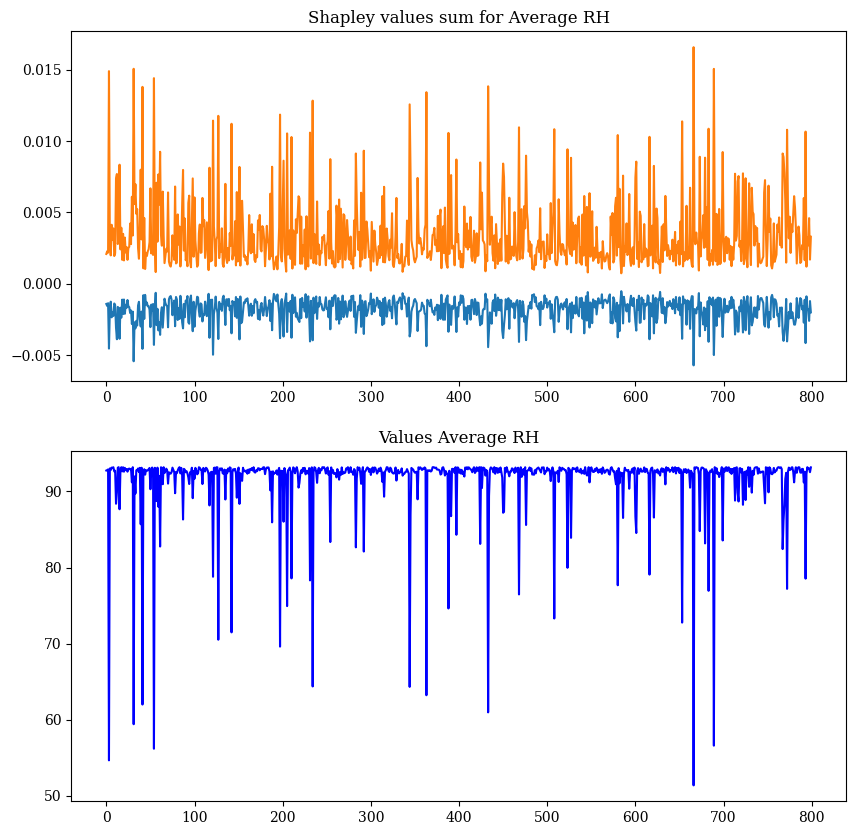

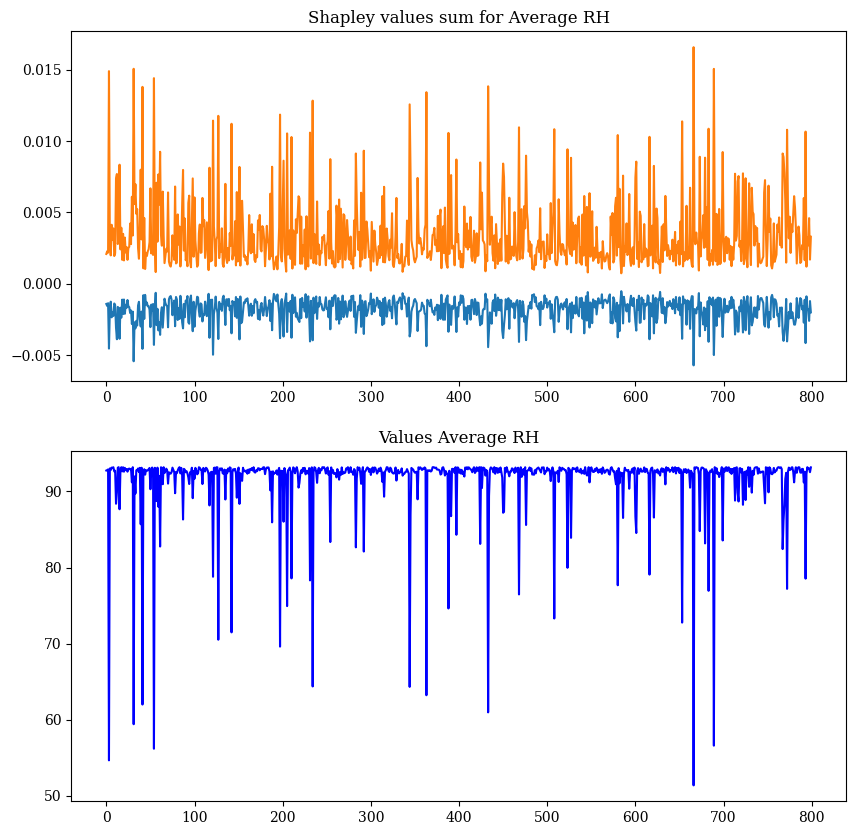

...

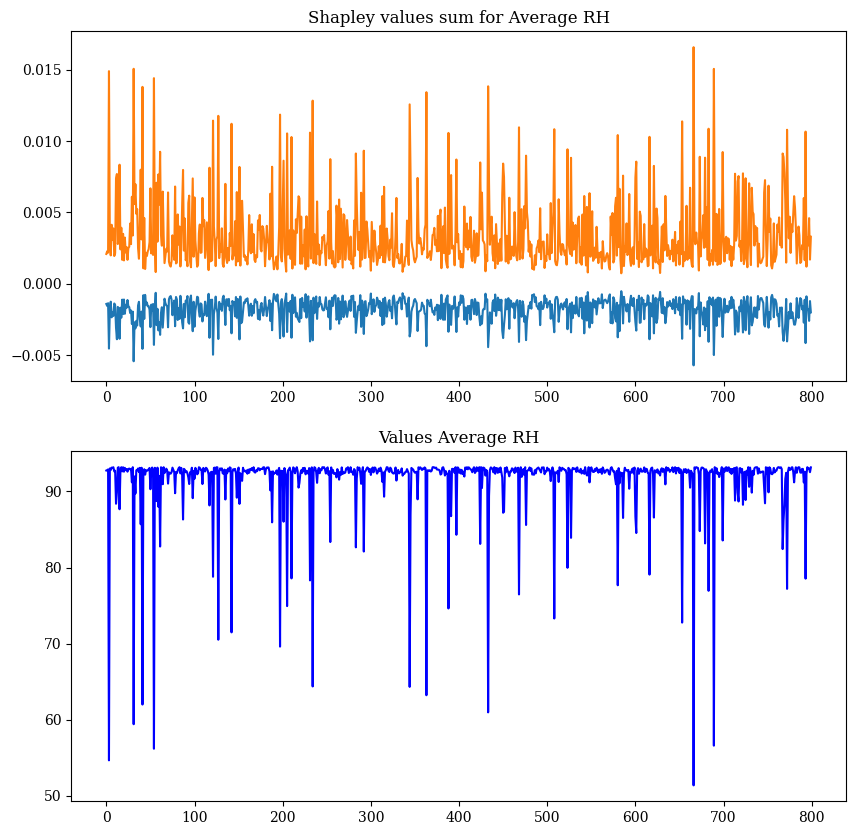

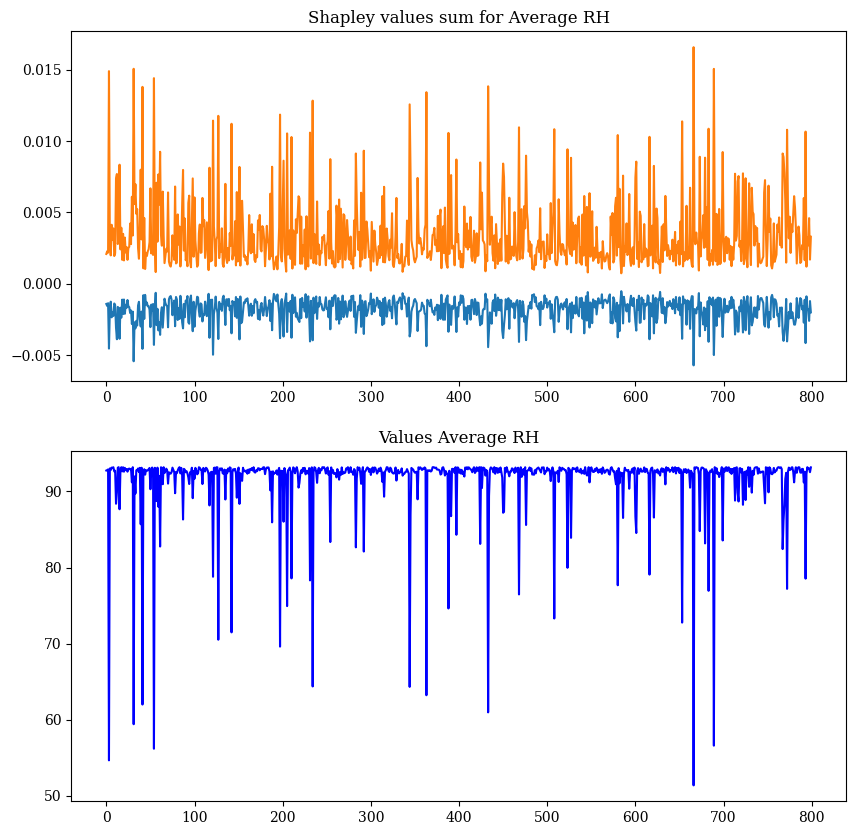

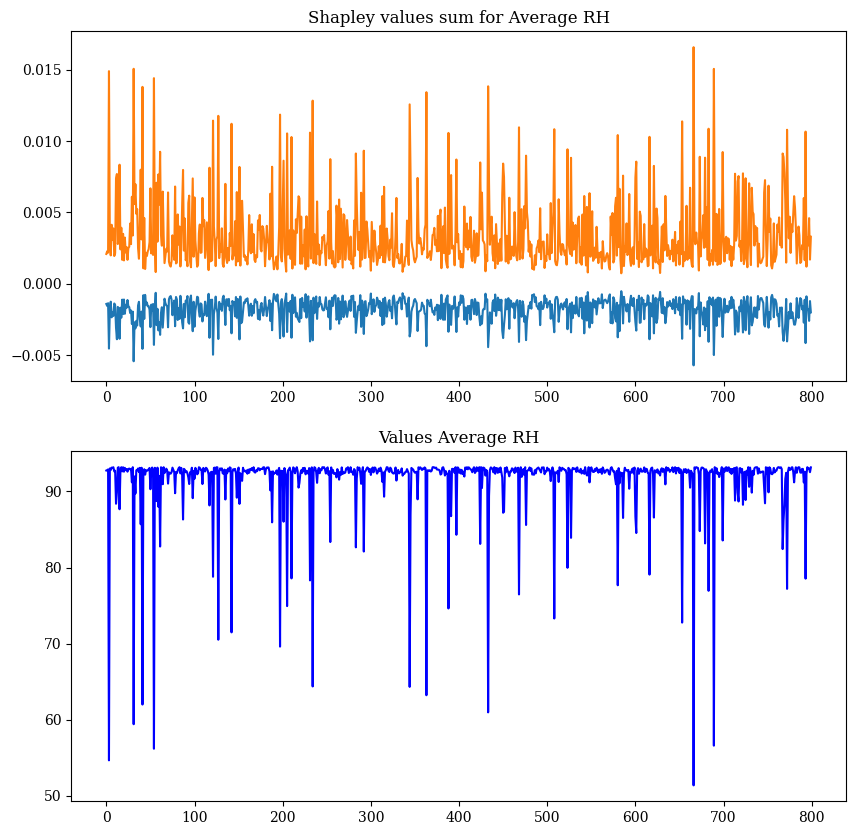

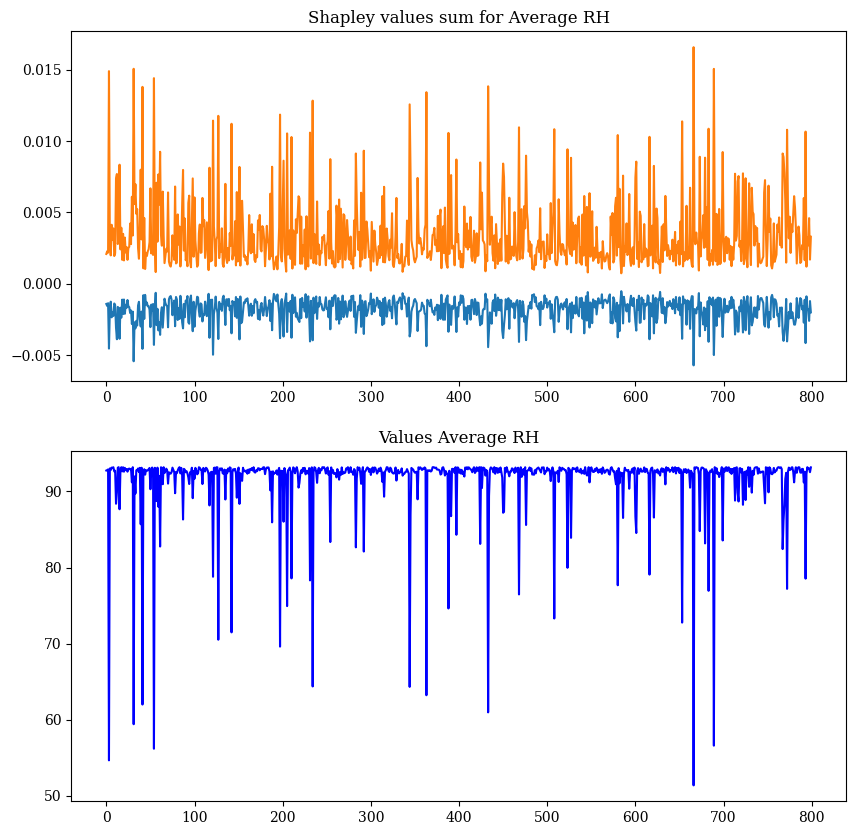

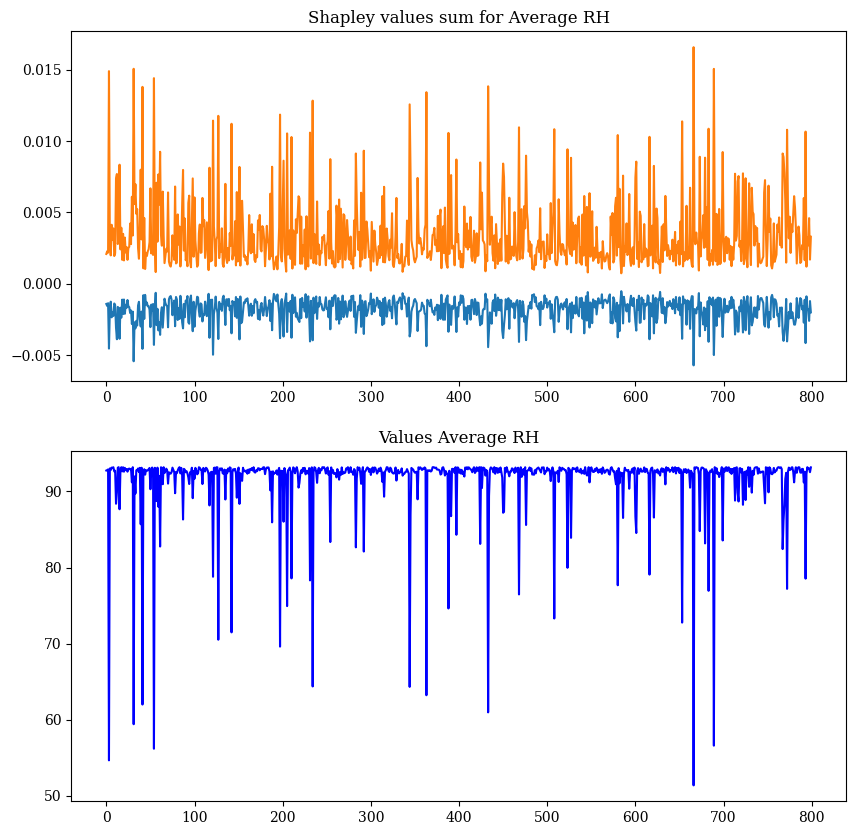

KeyboardInterrupt: 

In [16]:
from scipy.stats import gaussian_kde
# !!! EXPERIMENT !!!
def plot_feature_correlation_with_samples(all_features_shaps, all_samples, samples):
    for id in [15]:
        
        f = all_features_shaps[id].reshape(samples,-1)
        s = all_samples[id].reshape(samples,-1)

        # Calculate the mean and sum of SHAP values across all features
        plot_data_mean = np.mean(np.abs(np.array(f).reshape(samples, -1)), axis=0)
        plot_data_std = np.std(np.array(f).reshape(samples, -1), axis=0)
        plot_data_sum = np.sum(np.abs(np.array(f).reshape(samples, -1)), axis=0)

        plot_samples = np.mean(np.abs(np.array(s).reshape(samples, -1)), axis=0)
        plot_samples_sum = np.sum(np.abs(np.array(s).reshape(samples, -1)), axis=0)
        
        kde1 = gaussian_kde(plot_data_mean, bw_method=5)
    
        # Plot the sum of SHAP values
        #plt.hlines(0, 0, len(plot_data_sum), color='r')
        for shap in range(f.shape[0]):
            fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(10, 10))
            ax1.plot(plot_data_mean - plot_data_std)
            ax1.plot(plot_data_mean + plot_data_std)
            #ax1.set_ylim(-0.015,0.015)
            ax2.plot(kde1(plot_data_mean), c='blue')

            #ax2.plot(s[shap])
            #ax2.plot(plot_samples, color='black')
            #ax2.set_ylim(0,1)
            #ax1.set_xlim(300,400)
            #ax2.set_xlim(300,400)

            # Plot the centered moving average of the sum of SHAP values
            ax1.set_title(f'Shapley values sum for Average RH')
            ax2.set_title(f'Values Average RH')

            plt.show()




plot_feature_correlation_with_samples(shaps[0][0], samples[0][0], shaps[4])


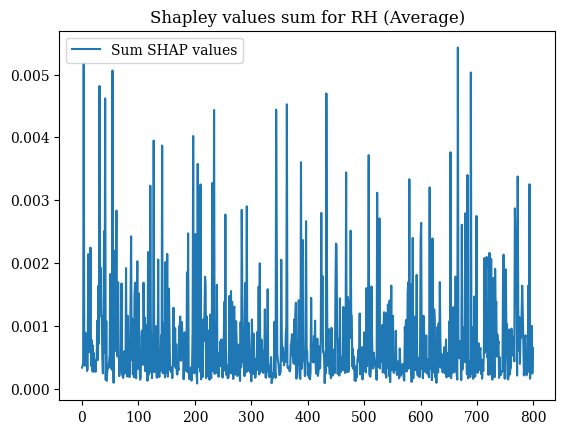

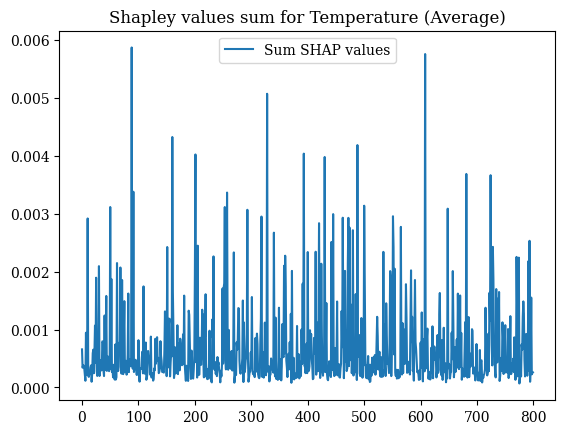

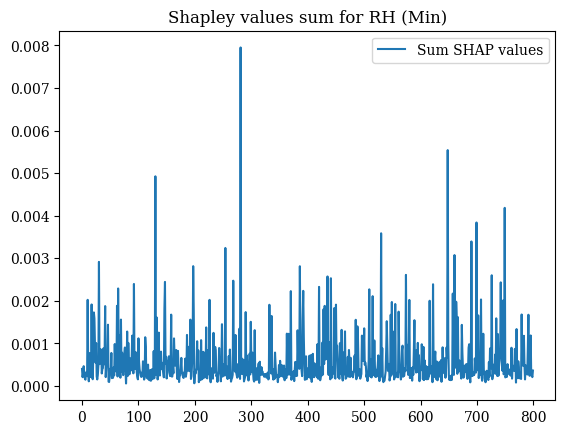

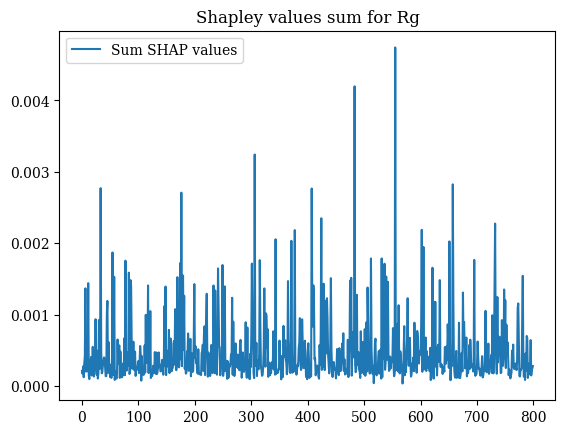

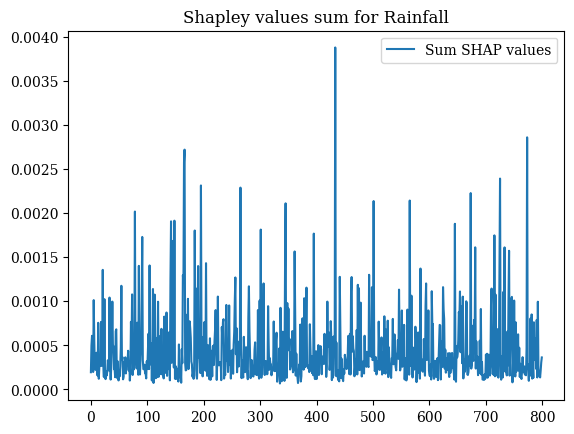

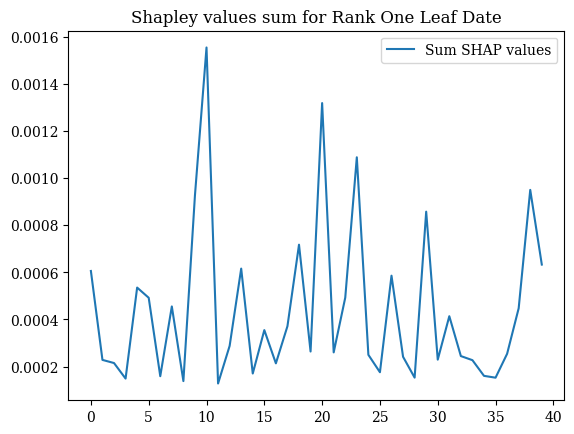

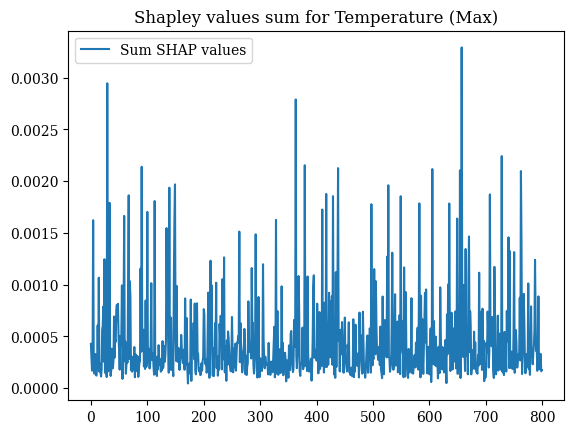

In [25]:

def plot_feature_correlation(all_features_shaps, samples):
    for id in [15, 12, 13, 18, 17, 0, 11]:
        f = all_features_shaps[id].reshape(samples,-1)
        # Calculate the mean and sum of SHAP values across all features
        plot_data_mean = np.mean(np.abs(np.array(f).reshape(samples, -1)), axis=0)
        plot_data_sum = np.sum(np.abs(np.array(f).reshape(samples, -1)), axis=0)
        
        # Determine the window size
        window_size = int(plot_data_mean.shape[0]*0.1)
        half_window = window_size // 2

        # Calculate the moving average with handling of edge effects
        moving_average_sum = np.zeros_like(plot_data_sum)

        for i in range(len(plot_data_sum)):
            start_idx = max(0, i - half_window)
            end_idx = min(len(plot_data_sum), i + half_window + 1)
            moving_average_sum[i] = np.mean(plot_data_sum[start_idx:end_idx])

        # Plot the sum of SHAP values
        #plt.hlines(0, 0, len(plot_data_sum), color='r')
        plt.plot(plot_data_mean, label='Sum SHAP values')

        # Plot the centered moving average of the sum of SHAP values
        
        #plt.plot(moving_average_sum, label=f'Moving average (window size {window_size})', linestyle='--')
        plt.title(f'Shapley values sum for {get_feature_label(f)[id]}')


        # Add legend to identify the lines
        plt.legend()

        # Show plot
        plt.show()


plot_feature_correlation(shaps[0][0], shaps[4])
